In [4]:
!pip install mediapy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 24.8 MB/s eta 0:00:00


In [5]:
# 1) Pin NumPy to <2 to avoid the v2 API breakage
!pip install --upgrade pip
!pip install "numpy<2.0.0"
!pip install jaxtyping

# 2) Install the official CUDA-enabled PyTorch (+cu118)
!pip install --extra-index-url https://download.pytorch.org/whl/cu118 \
    torch torchvision torchaudio --upgrade

# 3) Now install the HF stack (diffusers, transformers, accelerate, etc.)
!pip install diffusers transformers accelerate

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 20.3 MB/s eta 0:00:00
  Attempting uninstall: pip
    Found existing installation: pip 24.1.2
    Uninstalling pip-24.1.2:
      Successfully uninstalled pip-24.1.2
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 136.1 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
thinc 8.3.6 requires numpy<3.0.0,>=2.0.0, but you have numpy 1.26.4 which is incompatible.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/2 [jaxtyping]
Looking in indexes: https://pypi.org/simple, https://download.pytorch.org/whl/cu118
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 663.9/663.9 MB 37.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 147.8/147.8 MB 107

In [1]:
!nvidia-smi

Mon May 26 10:34:26 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off |   00000000:00:04.0 Off |                    0 |
| N/A   30C    P0             42W /  400W |       0MiB /  40960MiB |      0%      Default |
|                                         |                        |             Disabled |
+-----------------------------------------+-----

In [2]:
import torch, numpy as np
print("NumPy:", np.__version__)
print("PyTorch:", torch.__version__, "built with CUDA", torch.version.cuda)
print("CUDA available?", torch.cuda.is_available())



NumPy: 1.26.4
PyTorch: 2.7.0+cu118 built with CUDA 11.8
CUDA available? True


In [3]:
# Copyright 2022 The Nerfstudio Team. All rights reserved.
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#     http://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.
import os
import sys, argparse
from dataclasses import dataclass
from typing import Union

from rich.console import Console
from torch import Tensor, nn
from jaxtyping import Float

from __future__ import annotations
from typing import Any

from torch.autograd import Variable
import torchvision.transforms.functional as F
import numpy as np

from diffusers import DDIMScheduler

from PIL import Image
import copy, imageio
from tqdm import tqdm_notebook as tqdm
import logging

CONSOLE = Console(width=120)
DDIM_SOURCE = "CompVis/stable-diffusion-v1-4"

print("NumPy:", np.__version__)
print("PyTorch:", torch.__version__, "built with CUDA", torch.version.cuda)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

NumPy: 1.26.4
PyTorch: 2.7.0+cu118 built with CUDA 11.8
Using device: cuda


In [4]:
# Google Drive 연결
from google.colab import drive
drive.mount('/content/drive', force_remount=True)


# set original dataset path...
source_path = '/content/drive/MyDrive/dataset/cat' # path to original multi-view dataset
upscale_image = False # upscale recommended for instruct-nerf2nerf scenes except bear

Mounted at /content/drive


In [5]:
# Copyright 2023 Google LLC
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#      http://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.


from __future__ import annotations

from dataclasses import dataclass
from diffusers import StableDiffusionXLPipeline
import torch
import torch.nn as nn
from torch.nn import functional as nnf
from diffusers.models import attention_processor
import einops

T = torch.Tensor


@dataclass(frozen=True)
class StyleAlignedArgs:
    share_group_norm: bool = True
    share_layer_norm: bool = True,
    share_attention: bool = True
    adain_queries: bool = True
    adain_keys: bool = True
    adain_values: bool = False
    full_attention_share: bool = False
    shared_score_scale: float = 1.
    shared_score_shift: float = 0.
    only_self_level: float = 0.


def expand_first(feat: T, scale=1.,) -> T:
    b = feat.shape[0]
    feat_style = torch.stack((feat[0], feat[b // 2])).unsqueeze(1)
    if scale == 1:
        feat_style = feat_style.expand(2, b // 2, *feat.shape[1:])
    else:
        feat_style = feat_style.repeat(1, b // 2, 1, 1, 1)
        feat_style = torch.cat([feat_style[:, :1], scale * feat_style[:, 1:]], dim=1)
    return feat_style.reshape(*feat.shape)


def concat_first(feat: T, dim=2, scale=1.) -> T:
    feat_style = expand_first(feat, scale=scale)
    return torch.cat((feat, feat_style), dim=dim)


def calc_mean_std(feat, eps: float = 1e-5) -> tuple[T, T]:
    feat_std = (feat.var(dim=-2, keepdims=True) + eps).sqrt()
    feat_mean = feat.mean(dim=-2, keepdims=True)
    return feat_mean, feat_std


def adain(feat: T) -> T:
    feat_mean, feat_std = calc_mean_std(feat)
    feat_style_mean = expand_first(feat_mean)
    feat_style_std = expand_first(feat_std)
    feat = (feat - feat_mean) / feat_std
    feat = feat * feat_style_std + feat_style_mean
    return feat


class DefaultAttentionProcessor(nn.Module):

    def __init__(self):
        super().__init__()
        self.processor = attention_processor.AttnProcessor2_0()

    def __call__(self, attn: attention_processor.Attention, hidden_states, encoder_hidden_states=None,
                 attention_mask=None, **kwargs):
        return self.processor(attn, hidden_states, encoder_hidden_states, attention_mask)


class SharedAttentionProcessor(DefaultAttentionProcessor):

    def shifted_scaled_dot_product_attention(self, attn: attention_processor.Attention, query: T, key: T, value: T) -> T:
        logits = torch.einsum('bhqd,bhkd->bhqk', query, key) * attn.scale
        logits[:, :, :, query.shape[2]:] += self.shared_score_shift
        probs = logits.softmax(-1)
        return torch.einsum('bhqk,bhkd->bhqd', probs, value)

    def shared_call(
            self,
            attn: attention_processor.Attention,
            hidden_states,
            encoder_hidden_states=None,
            attention_mask=None,
            **kwargs
    ):

        residual = hidden_states
        input_ndim = hidden_states.ndim
        if input_ndim == 4:
            batch_size, channel, height, width = hidden_states.shape
            hidden_states = hidden_states.view(batch_size, channel, height * width).transpose(1, 2)
        batch_size, sequence_length, _ = (
            hidden_states.shape if encoder_hidden_states is None else encoder_hidden_states.shape
        )

        if attention_mask is not None:
            attention_mask = attn.prepare_attention_mask(attention_mask, sequence_length, batch_size)
            # scaled_dot_product_attention expects attention_mask shape to be
            # (batch, heads, source_length, target_length)
            attention_mask = attention_mask.view(batch_size, attn.heads, -1, attention_mask.shape[-1])

        if attn.group_norm is not None:
            hidden_states = attn.group_norm(hidden_states.transpose(1, 2)).transpose(1, 2)

        query = attn.to_q(hidden_states)
        key = attn.to_k(hidden_states)
        value = attn.to_v(hidden_states)
        inner_dim = key.shape[-1]
        head_dim = inner_dim // attn.heads

        query = query.view(batch_size, -1, attn.heads, head_dim).transpose(1, 2)
        key = key.view(batch_size, -1, attn.heads, head_dim).transpose(1, 2)
        value = value.view(batch_size, -1, attn.heads, head_dim).transpose(1, 2)
        # if self.step >= self.start_inject:
        if self.adain_queries:
            query = adain(query)
        if self.adain_keys:
            key = adain(key)
        if self.adain_values:
            value = adain(value)
        if self.share_attention:
            # before concat_first torch.Size([4, 10, 4096, 64]) after concat_first torch.Size([4, 10, 8192, 64])
            key = concat_first(key, -2, scale=self.shared_score_scale)
            value = concat_first(value, -2)
            if self.shared_score_shift != 0:
                hidden_states = self.shifted_scaled_dot_product_attention(attn, query, key, value,)
            else:
                hidden_states = nnf.scaled_dot_product_attention(
                    query, key, value, attn_mask=attention_mask, dropout_p=0.0, is_causal=False
                )
        else:
            hidden_states = nnf.scaled_dot_product_attention(
                query, key, value, attn_mask=attention_mask, dropout_p=0.0, is_causal=False
            )
        # hidden_states = adain(hidden_states)
        hidden_states = hidden_states.transpose(1, 2).reshape(batch_size, -1, attn.heads * head_dim)
        hidden_states = hidden_states.to(query.dtype)

        # linear proj
        hidden_states = attn.to_out[0](hidden_states)
        # dropout
        hidden_states = attn.to_out[1](hidden_states)

        if input_ndim == 4:
            hidden_states = hidden_states.transpose(-1, -2).reshape(batch_size, channel, height, width)

        if attn.residual_connection:
            hidden_states = hidden_states + residual

        hidden_states = hidden_states / attn.rescale_output_factor
        return hidden_states

    def __call__(self, attn: attention_processor.Attention, hidden_states, encoder_hidden_states=None,
                 attention_mask=None, **kwargs):
        if self.full_attention_share:
            b, n, d = hidden_states.shape
            #print('DEBUG hidden_states', hidden_states.shape) ([4, 4096, 640]) torch.Size([4, 1024, 1280])
            # [4, 1024, 1280]) -> [2, 2048, 1280]
            hidden_states = einops.rearrange(hidden_states, '(k b) n d -> k (b n) d', k=2)
            hidden_states = super().__call__(attn, hidden_states, encoder_hidden_states=encoder_hidden_states,
                                             attention_mask=attention_mask, **kwargs)
            hidden_states = einops.rearrange(hidden_states, 'k (b n) d -> (k b) n d', n=n)
        else:
            hidden_states = self.shared_call(attn, hidden_states, hidden_states, attention_mask, **kwargs)

        return hidden_states

    def __init__(self, style_aligned_args: StyleAlignedArgs):
        super().__init__()
        self.share_attention = style_aligned_args.share_attention
        self.adain_queries = style_aligned_args.adain_queries
        self.adain_keys = style_aligned_args.adain_keys
        self.adain_values = style_aligned_args.adain_values
        self.full_attention_share = style_aligned_args.full_attention_share
        self.shared_score_scale = style_aligned_args.shared_score_scale
        self.shared_score_shift = style_aligned_args.shared_score_shift


def _get_switch_vec(total_num_layers, level):
    if level == 0:
        return torch.zeros(total_num_layers, dtype=torch.bool)
    if level == 1:
        return torch.ones(total_num_layers, dtype=torch.bool)
    to_flip = level > .5
    if to_flip:
        level = 1 - level
    num_switch = int(level * total_num_layers)
    vec = torch.arange(total_num_layers)
    vec = vec % (total_num_layers // num_switch)
    vec = vec == 0
    if to_flip:
        vec = ~vec
    return vec


def init_attention_processors(pipeline: StableDiffusionXLPipeline, style_aligned_args: StyleAlignedArgs | None = None):
    attn_procs = {}
    unet = pipeline.unet
    number_of_self, number_of_cross = 0, 0
    num_self_layers = len([name for name in unet.attn_processors.keys() if 'attn1' in name])
    if style_aligned_args is None:
        only_self_vec = _get_switch_vec(num_self_layers, 1)
    else:
        only_self_vec = _get_switch_vec(num_self_layers, style_aligned_args.only_self_level)
    for i, name in enumerate(unet.attn_processors.keys()):
        is_self_attention = 'attn1' in name
        if is_self_attention:
            number_of_self += 1
            if style_aligned_args is None or only_self_vec[i // 2]:
                attn_procs[name] = DefaultAttentionProcessor()
            else:
                attn_procs[name] = SharedAttentionProcessor(style_aligned_args)
        else:
            number_of_cross += 1
            attn_procs[name] = DefaultAttentionProcessor()

    unet.set_attn_processor(attn_procs)


def register_shared_norm(pipeline: StableDiffusionXLPipeline,
                         share_group_norm: bool = True,
                         share_layer_norm: bool = True, ):
    def register_norm_forward(norm_layer: nn.GroupNorm | nn.LayerNorm) -> nn.GroupNorm | nn.LayerNorm:
        if not hasattr(norm_layer, 'orig_forward'):
            setattr(norm_layer, 'orig_forward', norm_layer.forward)
        orig_forward = norm_layer.orig_forward

        def forward_(hidden_states: T) -> T:
            n = hidden_states.shape[-2]
            hidden_states = concat_first(hidden_states, dim=-2)
            hidden_states = orig_forward(hidden_states)
            return hidden_states[..., :n, :]

        norm_layer.forward = forward_
        return norm_layer

    def get_norm_layers(pipeline_, norm_layers_: dict[str, list[nn.GroupNorm | nn.LayerNorm]]):
        if isinstance(pipeline_, nn.LayerNorm) and share_layer_norm:
            norm_layers_['layer'].append(pipeline_)
        if isinstance(pipeline_, nn.GroupNorm) and share_group_norm:
            norm_layers_['group'].append(pipeline_)
        else:
            for layer in pipeline_.children():
                get_norm_layers(layer, norm_layers_)

    norm_layers = {'group': [], 'layer': []}
    get_norm_layers(pipeline.unet, norm_layers)
    # regeister_norm_forward() for each norm layers
    return [register_norm_forward(layer) for layer in norm_layers['group']] + [register_norm_forward(layer) for layer in
                                                                               norm_layers['layer']]


class Handler:

    def register(self, style_aligned_args: StyleAlignedArgs, ):
        self.norm_layers = register_shared_norm(self.pipeline, style_aligned_args.share_group_norm,
                                                style_aligned_args.share_layer_norm)
        init_attention_processors(self.pipeline, style_aligned_args)

    def remove(self):
        for layer in self.norm_layers:
            layer.forward = layer.orig_forward
        self.norm_layers = []
        init_attention_processors(self.pipeline, None)

    def __init__(self, pipeline: StableDiffusionXLPipeline):
        self.pipeline = pipeline
        self.norm_layers = []


In [6]:
from __future__ import annotations

from dataclasses import dataclass
from typing import Union, Any
from rich.console import Console
import torch
from torch import Tensor, nn
from torch.autograd import Variable
import torchvision.transforms.functional as F
import numpy as np
from PIL import Image

from diffusers import ControlNetModel, StableDiffusionXLControlNetPipeline, StableDiffusionXLControlNetImg2ImgPipeline, AutoencoderKL
from diffusers.image_processor import PipelineImageInput
from diffusers.utils.torch_utils import is_compiled_module, is_torch_version
from transformers import DPTImageProcessor, DPTForDepthEstimation

SDXL_SOURCE = "stabilityai/stable-diffusion-xl-base-1.0"
CONTROLNET_SOURCE = "diffusers/controlnet-depth-sdxl-1.0"
VAE_SOURCE = "madebyollin/sdxl-vae-fp16-fix"

CONSOLE = Console(width=120)

class StylePix2Pix(nn.Module):
    """InstructPix2Pix implementation
    Args:
        device: device to use
        num_train_timesteps: number of training timesteps
    """

    def __init__(self, device: Union[torch.device, str], num_train_timesteps: int = 1000, sp2p_use_full_precision=False,
                share_group_norm=True, # False
                share_layer_norm=True, # False
                share_attention=True,
                adain_queries=True,
                adain_keys=True,
                adain_values=False, # False
                full_attention_share=False): # Added) -> None:
        super().__init__()

        self.device = device
        self.num_train_timesteps = num_train_timesteps
        self.sp2p_use_full_precision = sp2p_use_full_precision

        self.depth_estimator = DPTForDepthEstimation.from_pretrained("Intel/dpt-hybrid-midas").to("cuda")
        self.feature_processor = DPTImageProcessor.from_pretrained("Intel/dpt-hybrid-midas")

        # New
        self.controlnet = ControlNetModel.from_pretrained(
            CONTROLNET_SOURCE, #"diffusers/controlnet-depth-sdxl-1.0",
            variant="fp16",
            use_safetensors=True,
            torch_dtype=torch.float16,
        ).to(self.device)
        self.vae = AutoencoderKL.from_pretrained(VAE_SOURCE, torch_dtype=torch.float16).to(self.device)

        #pipe = StableDiffusionXLControlNetPipeline.from_pretrained(
        pipe = StableDiffusionXLControlNetImg2ImgPipeline.from_pretrained(
            SDXL_SOURCE,
            controlnet=self.controlnet,
            vae=self.vae,
            variant="fp16",
            use_safetensors=True,
            torch_dtype=torch.float16,
        )
        assert pipe is not None
        pipe = pipe.to(self.device)

        self.pipe = pipe

        # improve memory performance
        pipe.enable_attention_slicing()

        self.scheduler = pipe.scheduler
        self.alphas = self.scheduler.alphas_cumprod.to(self.device)  # type: ignore

        pipe.unet.eval()
        pipe.vae.eval()

        # use for improved quality at cost of higher memory
        if self.sp2p_use_full_precision:
            pipe.unet.float()
            pipe.vae.float()
        else:
            if self.device.index:
                #pipe.enable_model_cpu_offload(self.device.index)
                pipe.enable_model_cpu_offload(torch.cuda.current_device())
            else:
                pipe.enable_model_cpu_offload(0)

        self.unet = pipe.unet
        #self.auto_encoder = pipe.vae # remove

        # SA handler
        sa_args = StyleAlignedArgs(share_group_norm=share_group_norm, # False
                                      share_layer_norm=share_layer_norm, # False
                                      share_attention=share_attention,
                                      adain_queries=adain_queries,
                                      adain_keys=adain_keys,
                                      adain_values=adain_values, # False
                                      full_attention_share=full_attention_share, # Added
                                     )
        handler = Handler(pipe)
        handler.register(sa_args, )
        print('sa_args', sa_args)
        #print('WARNING no shared attention!')

        CONSOLE.print("StylePix2Pix loaded!")

    def get_depth_map(self, image: Image, feature_processor: DPTImageProcessor, depth_estimator: DPTForDepthEstimation) -> Image:
        image = feature_processor(images=image, return_tensors="pt").pixel_values.to("cuda")
        with torch.no_grad(), torch.autocast("cuda"):
            depth_map = depth_estimator(image).predicted_depth

        depth_map = torch.nn.functional.interpolate(
            depth_map.unsqueeze(1),
            size=(1024, 1024),
            mode="bicubic",
            align_corners=False,
        )
        depth_min = torch.amin(depth_map, dim=[1, 2, 3], keepdim=True)
        depth_max = torch.amax(depth_map, dim=[1, 2, 3], keepdim=True)
        depth_map = (depth_map - depth_min) / (depth_max - depth_min)
        image = torch.cat([depth_map] * 3, dim=1)

        image = image.permute(0, 2, 3, 1).cpu().numpy()[0]
        image = Image.fromarray((image * 255.0).clip(0, 255).astype(np.uint8))
        return image

    def concat_zero_control(self, control_reisduel: T) -> T:
        b = control_reisduel.shape[0] // 2
        zerso_reisduel = torch.zeros_like(control_reisduel[0:1])
        return torch.cat((zerso_reisduel, control_reisduel[:b], zerso_reisduel, control_reisduel[b::]))

    @torch.no_grad()
    def controlnet_call(
        self,
        pipeline: StableDiffusionXLControlNetPipeline,# self.pipe
        prompt: str | list[str] = None,
        prompt_2: str | list[str] | None = None,
        image: PipelineImageInput = None,
        height: int | None = None,
        width: int | None = None,
        num_inference_steps: int = 50,
        guidance_scale: float = 5.0,
        negative_prompt: str | list[str] | None = None,
        negative_prompt_2: str | list[str] | None = None,
        num_images_per_prompt: int = 1,
        eta: float = 0.0,
        generator: torch.Generator | None = None,
        latents: TN = None,
        prompt_embeds: TN = None,
        negative_prompt_embeds: TN = None,
        pooled_prompt_embeds: TN = None,
        negative_pooled_prompt_embeds: TN = None,
        cross_attention_kwargs: dict[str, Any] | None = None,
        controlnet_conditioning_scale: float | list[float] = 1.0,
        control_guidance_start: float | list[float] = 0.0,
        control_guidance_end: float | list[float] = 1.0,
        original_size: tuple[int, int] = None,
        crops_coords_top_left: tuple[int, int] = (0, 0),
        target_size: tuple[int, int] | None = None,
        negative_original_size: tuple[int, int] | None = None,
        negative_crops_coords_top_left: tuple[int, int] = (0, 0),
        negative_target_size:tuple[int, int] | None = None,
        clip_skip: int | None = None,
    ) -> list[Image]:

        controlnet = self.controlnet._orig_mod if is_compiled_module(pipeline.controlnet) else self.controlnet

        # align format for control guidance
        if not isinstance(control_guidance_start, list) and isinstance(control_guidance_end, list):
            control_guidance_start = len(control_guidance_end) * [control_guidance_start]
        elif not isinstance(control_guidance_end, list) and isinstance(control_guidance_start, list):
            control_guidance_end = len(control_guidance_start) * [control_guidance_end]
        elif not isinstance(control_guidance_start, list) and not isinstance(control_guidance_end, list):
            mult = 1
            control_guidance_start, control_guidance_end = (
                mult * [control_guidance_start],
                mult * [control_guidance_end],
            )

        # 1. Check inputs. Raise error if not correct
        pipeline.check_inputs(
            prompt,
            prompt_2,
            image,
            1,
            negative_prompt,
            negative_prompt_2,
            prompt_embeds,
            negative_prompt_embeds,
            pooled_prompt_embeds,
            negative_pooled_prompt_embeds,
            controlnet_conditioning_scale,
            control_guidance_start,
            control_guidance_end,
        )

        pipeline._guidance_scale = guidance_scale

        # 2. Define call parameters
        if prompt is not None and isinstance(prompt, str):
            batch_size = 1
        elif prompt is not None and isinstance(prompt, list):
            batch_size = len(prompt)
        else:
            batch_size = prompt_embeds.shape[0]

        device = pipeline._execution_device

        # 3. Encode input prompt
        text_encoder_lora_scale = (
            cross_attention_kwargs.get("scale", None) if cross_attention_kwargs is not None else None
        )
        (
            prompt_embeds,
            negative_prompt_embeds,
            pooled_prompt_embeds,
            negative_pooled_prompt_embeds,
        ) = pipeline.encode_prompt(
            prompt,
            prompt_2,
            device,
            1,
            True,
            negative_prompt,
            negative_prompt_2,
            prompt_embeds=prompt_embeds,
            negative_prompt_embeds=negative_prompt_embeds,
            pooled_prompt_embeds=pooled_prompt_embeds,
            negative_pooled_prompt_embeds=negative_pooled_prompt_embeds,
            lora_scale=text_encoder_lora_scale,
            clip_skip=clip_skip,
        )

        # 4. Prepare image
        if isinstance(controlnet, ControlNetModel):
            image = pipeline.prepare_image(
                image=image,
                width=width,
                height=height,
                batch_size=1,
                num_images_per_prompt=1,
                device=device,
                dtype=controlnet.dtype,
                do_classifier_free_guidance=True,
                guess_mode=False,
            )
            height, width = image.shape[-2:]
            image = torch.stack([image[0]] * num_images_per_prompt + [image[1]] * num_images_per_prompt)
        else:
            assert False
        # 5. Prepare timesteps
        pipeline.scheduler.set_timesteps(num_inference_steps, device=device)
        timesteps = pipeline.scheduler.timesteps

        # 6. Prepare latent variables
        num_channels_latents = pipeline.unet.config.in_channels
        latents = pipeline.prepare_latents(
            1 + num_images_per_prompt,
            num_channels_latents,
            height,
            width,
            prompt_embeds.dtype,
            device,
            generator,
            latents,
        )

        # 6.5 Optionally get Guidance Scale Embedding
        timestep_cond = None

        # 7. Prepare extra step kwargs.
        extra_step_kwargs = pipeline.prepare_extra_step_kwargs(generator, eta)

        # 7.1 Create tensor stating which controlnets to keep
        controlnet_keep = []
        for i in range(len(timesteps)):
            keeps = [
                1.0 - float(i / len(timesteps) < s or (i + 1) / len(timesteps) > e)
                for s, e in zip(control_guidance_start, control_guidance_end)
            ]
            controlnet_keep.append(keeps[0] if isinstance(controlnet, ControlNetModel) else keeps)

        # 7.2 Prepare added time ids & embeddings
        if isinstance(image, list):
            original_size = original_size or image[0].shape[-2:]
        else:
            original_size = original_size or image.shape[-2:]
        target_size = target_size or (height, width)

        add_text_embeds = pooled_prompt_embeds
        if pipeline.text_encoder_2 is None:
            text_encoder_projection_dim = int(pooled_prompt_embeds.shape[-1])
        else:
            text_encoder_projection_dim = pipeline.text_encoder_2.config.projection_dim

        add_time_ids = pipeline._get_add_time_ids(
            original_size,
            crops_coords_top_left,
            target_size,
            dtype=prompt_embeds.dtype,
            text_encoder_projection_dim=text_encoder_projection_dim,
        )

        if negative_original_size is not None and negative_target_size is not None:
            negative_add_time_ids = pipeline._get_add_time_ids(
                negative_original_size,
                negative_crops_coords_top_left,
                negative_target_size,
                dtype=prompt_embeds.dtype,
                text_encoder_projection_dim=text_encoder_projection_dim,
            )
        else:
            negative_add_time_ids = add_time_ids

        prompt_embeds = torch.stack([prompt_embeds[0]] + [prompt_embeds[1]] * num_images_per_prompt)
        negative_prompt_embeds = torch.stack([negative_prompt_embeds[0]] + [negative_prompt_embeds[1]] * num_images_per_prompt)
        negative_pooled_prompt_embeds = torch.stack([negative_pooled_prompt_embeds[0]] + [negative_pooled_prompt_embeds[1]] * num_images_per_prompt)
        add_text_embeds = torch.stack([add_text_embeds[0]] + [add_text_embeds[1]] * num_images_per_prompt)
        prompt_embeds = torch.cat([negative_prompt_embeds, prompt_embeds], dim=0)
        add_text_embeds = torch.cat([negative_pooled_prompt_embeds, add_text_embeds], dim=0)
        add_time_ids = torch.cat([negative_add_time_ids, add_time_ids], dim=0)

        prompt_embeds = prompt_embeds.to(device)
        add_text_embeds = add_text_embeds.to(device)
        add_time_ids = add_time_ids.to(device).repeat(1 + num_images_per_prompt, 1)
        batch_size = num_images_per_prompt + 1
        # 8. Denoising loop
        num_warmup_steps = len(timesteps) - num_inference_steps * pipeline.scheduler.order
        is_unet_compiled = is_compiled_module(pipeline.unet)
        is_controlnet_compiled = is_compiled_module(pipeline.controlnet)
        is_torch_higher_equal_2_1 = is_torch_version(">=", "2.1")
        added_cond_kwargs = {"text_embeds": add_text_embeds, "time_ids": add_time_ids}
        controlnet_prompt_embeds = torch.cat((prompt_embeds[1:batch_size], prompt_embeds[1:batch_size]))
        controlnet_added_cond_kwargs = {key: torch.cat((item[1:batch_size,], item[1:batch_size])) for key, item in added_cond_kwargs.items()}
        with pipeline.progress_bar(total=num_inference_steps) as progress_bar:
            for i, t in enumerate(timesteps):
                # Relevant thread:
                # https://dev-discuss.pytorch.org/t/cudagraphs-in-pytorch-2-0/1428
                if (is_unet_compiled and is_controlnet_compiled) and is_torch_higher_equal_2_1:
                    torch._inductor.cudagraph_mark_step_begin()
                # expand the latents if we are doing classifier free guidance
                latent_model_input = torch.cat([latents] * 2)
                latent_model_input = pipeline.scheduler.scale_model_input(latent_model_input, t)

                # controlnet(s) inference
                control_model_input = torch.cat((latent_model_input[1:batch_size,], latent_model_input[batch_size+1:]))

                if isinstance(controlnet_keep[i], list):
                    cond_scale = [c * s for c, s in zip(controlnet_conditioning_scale, controlnet_keep[i])]
                else:
                    controlnet_cond_scale = controlnet_conditioning_scale
                    if isinstance(controlnet_cond_scale, list):
                        controlnet_cond_scale = controlnet_cond_scale[0]
                    cond_scale = controlnet_cond_scale * controlnet_keep[i]
                if cond_scale > 0:
                    down_block_res_samples, mid_block_res_sample = pipeline.controlnet(
                        control_model_input,
                        t,
                        encoder_hidden_states=controlnet_prompt_embeds,
                        controlnet_cond=image,
                        conditioning_scale=cond_scale,
                        guess_mode=False,
                        added_cond_kwargs=controlnet_added_cond_kwargs,
                        return_dict=False,
                    )

                    mid_block_res_sample = self.concat_zero_control(mid_block_res_sample)
                    down_block_res_samples =  [self.concat_zero_control(down_block_res_sample) for down_block_res_sample in down_block_res_samples]
                else:
                    mid_block_res_sample = down_block_res_samples = None
                # predict the noise residual
                noise_pred = pipeline.unet(
                    latent_model_input,
                    t,
                    encoder_hidden_states=prompt_embeds,
                    timestep_cond=timestep_cond,
                    cross_attention_kwargs=cross_attention_kwargs,
                    down_block_additional_residuals=down_block_res_samples,
                    mid_block_additional_residual=mid_block_res_sample,
                    added_cond_kwargs=added_cond_kwargs,
                    return_dict=False,
                )[0]

                # perform guidance
                noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
                noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

                # compute the previous noisy sample x_t -> x_t-1
                latents = pipeline.scheduler.step(noise_pred, t, latents, **extra_step_kwargs, return_dict=False)[0]

                if i == len(timesteps) - 1 or ((i + 1) > num_warmup_steps and (i + 1) % pipeline.scheduler.order == 0):
                    progress_bar.update()

        # manually for max memory savings
        if pipeline.vae.dtype == torch.float16 and pipeline.vae.config.force_upcast:
            pipeline.upcast_vae()
            latents = latents.to(next(iter(pipeline.vae.post_quant_conv.parameters())).dtype)

        # make sure the VAE is in float32 mode, as it overflows in float16
        needs_upcasting = pipeline.vae.dtype == torch.float16 and pipeline.vae.config.force_upcast

        if needs_upcasting:
            pipeline.upcast_vae()
            latents = latents.to(next(iter(pipeline.vae.post_quant_conv.parameters())).dtype)

        image = pipeline.vae.decode(latents / pipeline.vae.config.scaling_factor, return_dict=False)[0]

        # cast back to fp16 if needed
        if needs_upcasting:
            pipeline.vae.to(dtype=torch.float16)

        if pipeline.watermark is not None:
            image = pipeline.watermark.apply_watermark(image)

        #image = pipeline.image_processor.postprocess(image, output_type='pil')

        # Offload all models
        pipeline.maybe_free_model_hooks()
        return image

    @torch.no_grad()
    def controlnet_img2img_call(
        self,
        pipeline: StableDiffusionControlNetImg2ImgPipeline,
        prompt: str | list[str] = None,
        prompt_2: str | list[str] | None = None,
        image: PipelineImageInput = None,
        control_image: PipelineIageInput = None,
        height: int | None = None,
        width: int | None = None,
        strength: float = 0.8,
        num_inference_steps: int = 50,
        guidance_scale: float = 5.0,
        negative_prompt: str | list[str] | None = None,
        negative_prompt_2: str | list[str] | None = None,
        num_images_per_prompt: int = 1,
        eta: float = 0.0,
        generator: torch.Generator | None = None,
        latents: TN = None,
        prompt_embeds: TN = None,
        negative_prompt_embeds: TN = None,
        pooled_prompt_embeds: TN = None,
        negative_pooled_prompt_embeds: TN = None,
        cross_attention_kwargs: dict[str, Any] | None = None,
        controlnet_conditioning_scale: float | list[float] = 1.0,
        control_guidance_start: float | list[float] = 0.0,
        control_guidance_end: float | list[float] = 1.0,
        original_size: tuple[int, int] = None,
        crops_coords_top_left: tuple[int, int] = (0, 0),
        target_size: tuple[int, int] | None = None,
        negative_original_size: tuple[int, int] | None = None, # need update
        negative_crops_coords_top_left: tuple[int, int] = (0, 0), # need update
        negative_target_size:tuple[int, int] | None = None, # need update
        aesthetic_score: float = 6.0, #added
        negative_aesthetic_score: float = 2.5, #added
        clip_skip: int | None = None,
    ) -> list[Image]:
        controlnet = pipeline.controlnet._orig_mod if is_compiled_module(pipeline.controlnet) else pipeline.controlnet
        #controlnet = pipeline.controlnet
        #controlnet.eval()

        # align format for control guidance
        if not isinstance(control_guidance_start, list) and isinstance(control_guidance_end, list):
            control_guidance_start = len(control_guidance_end) * [control_guidance_start]
        elif not isinstance(control_guidance_end, list) and isinstance(control_guidance_start, list):
            control_guidance_end = len(control_guidance_start) * [control_guidance_end]
        elif not isinstance(control_guidance_start, list) and not isinstance(control_guidance_end, list):
            mult = 1
            control_guidance_start, control_guidance_end = (
                mult * [control_guidance_start],
                mult * [control_guidance_end],
            )

        # 1. Check inputs. Raise error if not correct
        print('Debug controlnet_conditioning_scale', controlnet_conditioning_scale, isinstance(controlnet_conditioning_scale, float))
        pipeline.check_inputs(
            prompt=prompt,
            prompt_2=prompt_2,
            image=control_image,
            strength=strength,
            num_inference_steps=num_inference_steps,
            callback_steps=1,
            negative_prompt=negative_prompt,
            negative_prompt_2=negative_prompt_2,
            prompt_embeds=prompt_embeds,
            negative_prompt_embeds=negative_prompt_embeds,
            pooled_prompt_embeds=pooled_prompt_embeds,
            negative_pooled_prompt_embeds=negative_pooled_prompt_embeds,
            controlnet_conditioning_scale=controlnet_conditioning_scale,
            control_guidance_start=control_guidance_start,
            control_guidance_end=control_guidance_end,
        )

        pipeline._guidance_scale = guidance_scale

        # 2. Define call parameters
        if prompt is not None and isinstance(prompt, str):
            batch_size = 1
        elif prompt is not None and isinstance(prompt, list):
            batch_size = len(prompt)
        else:
            batch_size = prompt_embeds.shape[0]

        device = pipeline._execution_device

        # 3. Encode input prompt
        text_encoder_lora_scale = (
            cross_attention_kwargs.get("scale", None) if cross_attention_kwargs is not None else None
        )
        (
            prompt_embeds,
            negative_prompt_embeds,
            pooled_prompt_embeds,
            negative_pooled_prompt_embeds,
        ) = pipeline.encode_prompt(
            prompt,
            prompt_2,
            device,
            1,
            True,
            negative_prompt,
            negative_prompt_2,
            prompt_embeds=prompt_embeds,
            negative_prompt_embeds=negative_prompt_embeds,
            pooled_prompt_embeds=pooled_prompt_embeds,
            negative_pooled_prompt_embeds=negative_pooled_prompt_embeds,
            lora_scale=text_encoder_lora_scale,
            clip_skip=clip_skip,
        )

        # 4. Prepare image
        # 4. Prepare image and controlnet_conditioning_image
        image = pipeline.image_processor.preprocess(image, height=height, width=width).to(dtype=torch.float32)

        if isinstance(controlnet, ControlNetModel):
            control_image = pipeline.prepare_control_image(
                image=control_image,
                width=width,
                height=height,
                batch_size=batch_size * num_images_per_prompt, # changed from 1
                num_images_per_prompt=1,
                device=device,
                dtype=controlnet.dtype,
                do_classifier_free_guidance=True,
                guess_mode=False,
            )
            height, width = control_image.shape[-2:]

            #ref_image = load_image("./temp/cat.png").resize((1024, 1024))
            #ref_image = pipeline.image_processor.preprocess(ref_image, height=height, width=width).to(dtype=torch.float32)
            #image = torch.cat([ref_image, image])
            #image = torch.cat([image, image])
            #image = torch.cat([torch.rand_like(image),image])
            #print('DEBUG control_image before stack', control_image.shape)
            #print('DEBUG', control_image.mean(), control_image.min(), control_image.max())
            #image = torch.stack([image * num_images_per_prompt * 2 + [image[1]] * num_images_per_prompt * 2)

            #control_image = torch.stack([control_image[0]] * num_images_per_prompt + [control_image[1]] * num_images_per_prompt) # style-aligned

            #print('DEBUG image, control_image', image.shape, control_image.shape) # [2, 3, 1024, 1024], [2, 3, 1024, 1024]
        else:
            assert False
        # 5. Prepare timesteps
        pipeline.scheduler.set_timesteps(num_inference_steps, device=device)
        #timesteps = pipeline.scheduler.timesteps

        # added
        timesteps, num_inference_steps = pipeline.get_timesteps(num_inference_steps, strength, device)
        latent_timestep = timesteps[:1].repeat(batch_size * num_images_per_prompt)
        #print('DEBUG batch_size * image.shape[0]', batch_size, image.shape[0])
        #latent_timestep = timesteps[:1].repeat(image.shape[0])
        pipeline._num_timesteps = len(timesteps)
        #print('DEBUG timesteps, latent_timestep', timesteps.shape, latent_timestep)

        # 6. Prepare latent variables
        num_channels_latents = pipeline.unet.config.in_channels
        # pipeline_controlnet (not img2img) def prepare_latents(self, batch_size, num_channels_latents, height, width, dtype, device, generator, latents=None):
        # piepline_controlnet_img2img def prepare_latents(self, image, timestep, batch_size, num_images_per_prompt, dtype, device, generator=None):
        '''
        latents = pipeline.prepare_latents(
            1 + num_images_per_prompt,
            num_channels_latents,
            height,
            width,
            prompt_embeds.dtype,
            device,
            generator,
            latents,
        )
        '''
        #print('DEBUG prepare_latents', image.shape, latent_timestep.shape)
        latents = pipeline.prepare_latents(
        #latents = self.prepare_img2img_latents(
            image,
            latent_timestep,
            batch_size,
            num_images_per_prompt, # 1 + num_images_per_prompt,
            prompt_embeds.dtype,
            device,
            generator,
        )

        # 6.5 Optionally get Guidance Scale Embedding
        timestep_cond = None

        # 7. Prepare extra step kwargs.
        extra_step_kwargs = pipeline.prepare_extra_step_kwargs(generator, eta)

        # 7.1 Create tensor stating which controlnets to keep
        controlnet_keep = []
        for i in range(len(timesteps)):
            keeps = [
                1.0 - float(i / len(timesteps) < s or (i + 1) / len(timesteps) > e)
                for s, e in zip(control_guidance_start, control_guidance_end)
            ]
            controlnet_keep.append(keeps[0] if isinstance(controlnet, ControlNetModel) else keeps)

        # 7.2 Prepare added time ids & embeddings
        if isinstance(control_image, list):
            original_size = original_size or control_image[0].shape[-2:]
        else:
            original_size = original_size or control_image.shape[-2:]
        target_size = target_size or (height, width)

        # added for img2img
        if negative_original_size is None:
            negative_original_size = original_size
        if negative_target_size is None:
            negative_target_size = target_size
        add_text_embeds = pooled_prompt_embeds

        if pipeline.text_encoder_2 is None:
            text_encoder_projection_dim = int(pooled_prompt_embeds.shape[-1])
        else:
            text_encoder_projection_dim = pipeline.text_encoder_2.config.projection_dim

        #added
        add_time_ids, negative_add_time_ids = pipeline._get_add_time_ids(
            original_size,
            crops_coords_top_left,
            target_size,
            aesthetic_score,
            negative_aesthetic_score,
            negative_original_size,
            negative_crops_coords_top_left,
            negative_target_size,
            dtype=prompt_embeds.dtype,
            text_encoder_projection_dim=text_encoder_projection_dim,
        )
        add_time_ids = add_time_ids.repeat(batch_size * num_images_per_prompt, 1)

        prompt_embeds = torch.cat([negative_prompt_embeds, prompt_embeds], dim=0)
        add_text_embeds = torch.cat([negative_pooled_prompt_embeds, add_text_embeds], dim=0)
        negative_add_time_ids = negative_add_time_ids.repeat(batch_size * num_images_per_prompt, 1)
        add_time_ids = torch.cat([negative_add_time_ids, add_time_ids], dim=0) # requires debug

        prompt_embeds = prompt_embeds.to(device)
        add_text_embeds = add_text_embeds.to(device)
        add_time_ids = add_time_ids.to(device) #.repeat(batch_size * num_images_per_prompt, 1)

        #batch_size = num_images_per_prompt + 1 #
        # 8. Denoising loop (Style-Aligned Original)
        num_warmup_steps = len(timesteps) - num_inference_steps * pipeline.scheduler.order
        is_unet_compiled = is_compiled_module(pipeline.unet)
        is_controlnet_compiled = is_compiled_module(pipeline.controlnet)
        is_torch_higher_equal_2_1 = is_torch_version(">=", "2.1")

        with pipeline.progress_bar(total=num_inference_steps) as progress_bar:
            for i, t in enumerate(timesteps):
                # Relevant thread:
                # https://dev-discuss.pytorch.org/t/cudagraphs-in-pytorch-2-0/1428
                if (is_unet_compiled and is_controlnet_compiled) and is_torch_higher_equal_2_1:
                    torch._inductor.cudagraph_mark_step_begin()
                # expand the latents if we are doing classifier free guidance
                latent_model_input = torch.cat([latents] * 2) # [4,4,128,128]
                latent_model_input = pipeline.scheduler.scale_model_input(latent_model_input, t)

                added_cond_kwargs = {"text_embeds": add_text_embeds, "time_ids": add_time_ids}

                # controlnet(s) inference
                control_model_input = latent_model_input # from vanilla
                controlnet_prompt_embeds = prompt_embeds # from vanilla
                controlnet_added_cond_kwargs = added_cond_kwargs # from vanilla

                if isinstance(controlnet_keep[i], list):
                    cond_scale = [c * s for c, s in zip(controlnet_conditioning_scale, controlnet_keep[i])]
                else:
                    controlnet_cond_scale = controlnet_conditioning_scale
                    if isinstance(controlnet_cond_scale, list):
                        controlnet_cond_scale = controlnet_cond_scale[0]
                    cond_scale = controlnet_cond_scale * controlnet_keep[i]
                if cond_scale > 0:
                    #with torch.no_grad():
                    down_block_res_samples, mid_block_res_sample = pipeline.controlnet(
                        control_model_input,
                        t,
                        encoder_hidden_states=controlnet_prompt_embeds,
                        controlnet_cond=control_image,
                        conditioning_scale=cond_scale,
                        guess_mode=False,
                        added_cond_kwargs=controlnet_added_cond_kwargs,
                        return_dict=False,
                    )

                else:
                    mid_block_res_sample = down_block_res_samples = None

                noise_pred = pipeline.unet(
                    latent_model_input,
                    t,
                    encoder_hidden_states=prompt_embeds,
                    timestep_cond=timestep_cond,
                    cross_attention_kwargs=cross_attention_kwargs,
                    down_block_additional_residuals=down_block_res_samples,
                    mid_block_additional_residual=mid_block_res_sample,
                    added_cond_kwargs=added_cond_kwargs,
                    return_dict=False,
                )[0]

                # perform guidance
                noise_pred_uncond, noise_pred_text = noise_pred.chunk(2) # torch.Size([2, 4, 128, 128]) torch.Size([2, 4, 128, 128])
                noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

                # compute the previous noisy sample x_t -> x_t-1
                latents = pipeline.scheduler.step(noise_pred, t, latents, **extra_step_kwargs, return_dict=False)[0]

                if i == len(timesteps) - 1 or ((i + 1) > num_warmup_steps and (i + 1) % pipeline.scheduler.order == 0):
                    progress_bar.update()
                #print('DEBUG END')
                #sys.exit()

        # manually for max memory savings
        if pipeline.vae.dtype == torch.float16 and pipeline.vae.config.force_upcast:
            pipeline.upcast_vae()
            latents = latents.to(next(iter(pipeline.vae.post_quant_conv.parameters())).dtype)

        # make sure the VAE is in float32 mode, as it overflows in float16
        needs_upcasting = pipeline.vae.dtype == torch.float16 and pipeline.vae.config.force_upcast

        if needs_upcasting:
            pipeline.upcast_vae()
            latents = latents.to(next(iter(pipeline.vae.post_quant_conv.parameters())).dtype)

        image = pipeline.vae.decode(latents / pipeline.vae.config.scaling_factor, return_dict=False)[0]

        # cast back to fp16 if needed
        if needs_upcasting:
            pipeline.vae.to(dtype=torch.float16)

        if pipeline.watermark is not None:
            image = pipeline.watermark.apply_watermark(image)

        #image = pipeline.image_processor.postprocess(image, output_type='pil')

        # Offload all models
        pipeline.maybe_free_model_hooks()
        return image


    def latents_to_img(self, latents: Float[Tensor, "BS 4 H W"]) -> Float[Tensor, "BS 3 H W"]:
        """Convert latents to images
        Args:
            latents: Latents to convert
        Returns:
            Images
        """

        latents = 1 / CONST_SCALE * latents

        with torch.no_grad():
            imgs = self.auto_encoder.decode(latents).sample

        imgs = (imgs / 2 + 0.5).clamp(0, 1)

        return imgs

    def imgs_to_latent(self, imgs: Float[Tensor, "BS 3 H W"]) -> Float[Tensor, "BS 4 H W"]:
        """Convert images to latents
        Args:
            imgs: Images to convert
        Returns:
            Latents
        """
        imgs = 2 * imgs - 1

        posterior = self.auto_encoder.encode(imgs).latent_dist
        latents = posterior.sample() * CONST_SCALE

        return latents

    def prepare_image_latents(self, imgs: Float[Tensor, "BS 3 H W"]) -> Float[Tensor, "BS 4 H W"]:
        """Convert conditioning image to latents used for classifier-free guidance
        Args:
            imgs: Images to convert
        Returns:
            Latents
        """
        imgs = 2 * imgs - 1

        image_latents = self.auto_encoder.encode(imgs).latent_dist.mode()

        uncond_image_latents = torch.zeros_like(image_latents)
        image_latents = torch.cat([image_latents, image_latents, uncond_image_latents], dim=0)

        return image_latents

    def forward(self):
        """Not implemented since we only want the parameter saving of the nn module, but not forward()"""
        raise NotImplementedError


In [7]:
# Fully shared attention w/ sdxl
device = 'cuda'

sp2p = StylePix2Pix(device, sp2p_use_full_precision=False,
                share_group_norm=True, # False
                share_layer_norm=True, # False
                share_attention=True,
                adain_queries=True,
                adain_keys=True,
                adain_values=True, # False
                full_attention_share=True # False:
                )

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/9.88k [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


pytorch_model.bin:   0%|          | 0.00/490M [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/490M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/382 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.27k [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/2.50G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/631 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

model_index.json:   0%|          | 0.00/609 [00:00<?, ?B/s]

Fetching 17 files:   0%|          | 0/17 [00:00<?, ?it/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/565 [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`
Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


config.json:   0%|          | 0.00/1.68k [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/5.14G [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

sa_args StyleAlignedArgs(share_group_norm=True, share_layer_norm=True, share_attention=True, adain_queries=True, adain_keys=True, adain_values=True, full_attention_share=True, shared_score_scale=1.0, shared_score_shift=0.0, only_self_level=0.0)


StylePix2Pix loaded!

Num of training views: 20 / file extension: jpg  at path: /content/drive/MyDrive/dataset/cat / Upscale training images?: False


""

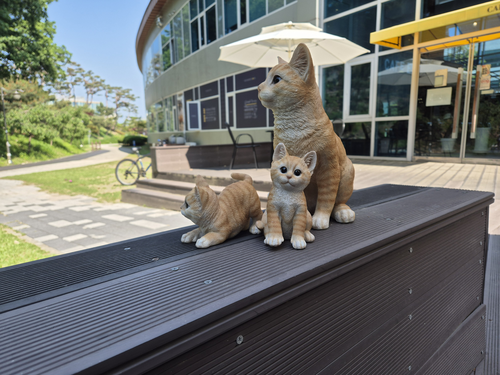

Size: (500, 375)


In [15]:
# Load source views

from diffusers.utils import load_image
import random, glob
import mediapy

def load_and_resize(path, max_edge=500):
    img = load_image(path)           # a PIL.Image.Image
    w, h = img.size
    # If it’s already small enough, return a copy:
    if max(w, h) <= max_edge:
        return img.copy()

    # scale factor so that the longer side → max_edge
    scale = max_edge / max(w, h)
    new_size = (round(w * scale), round(h * scale))
    # resize with high-quality filter
    return img.resize(new_size, Image.LANCZOS)




# g = glob.glob(f'{source_path}/images_4/*')
g = glob.glob(f'{source_path}/*')
num_of_views =len(g)
ext = g[0].split('/')[-1].split('.')[-1]
print('Num of training views:', num_of_views, '/ file extension:', ext, ' at path:', source_path, '/ Upscale training images?:', upscale_image)

img_indices = [i for i in range(1, num_of_views+1)]

filenames = sorted(f for f in os.listdir(source_path) if f.lower().endswith(".jpg"))


# images = [load_image(f"{source_path}/images/frame_{str(i).zfill(5)}.{ext}") for i in img_indices]
images = [
    load_and_resize(os.path.join(source_path, fn), max_edge=500)
    for fn in filenames
]


H = images[0].size[1]
W = images[0].size[0]
if upscale_image:
    images = [image.resize((2*W, 2*H)) for image in images]
    #depth_images_nerf = [image.resize((2*W, 2*H)) for image in depth_images_nerf]

mediapy.show_images(images[::36])
#mediapy.show_images(depth_images_nerf[::36])

print('Size:', images[0].size)
#print(depth_images_nerf[0].size)

Size: 375 500


,,,

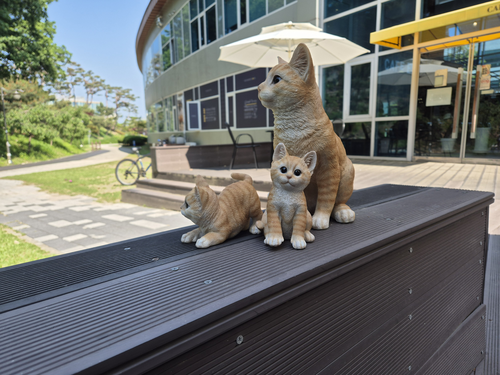
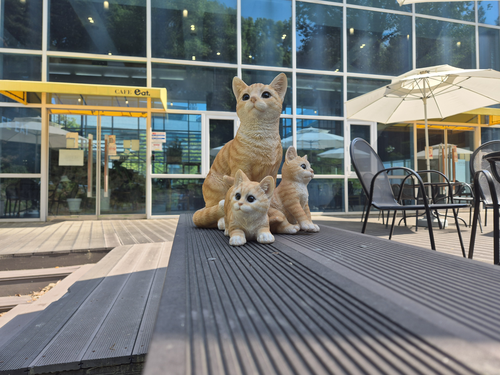
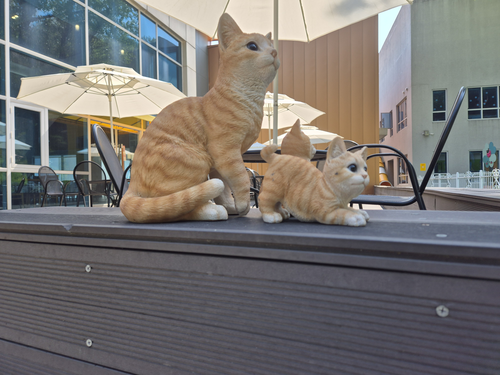
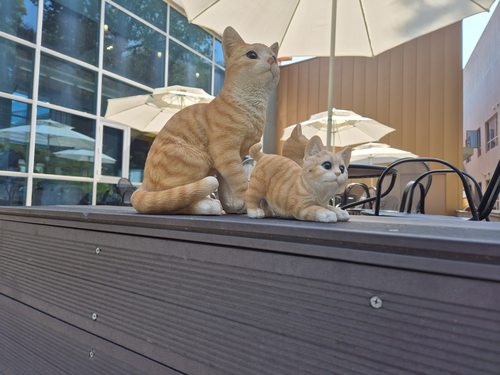

,,,

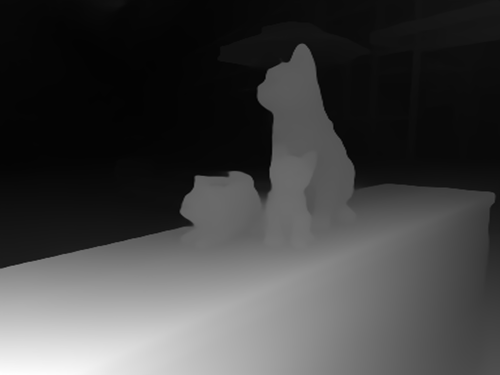
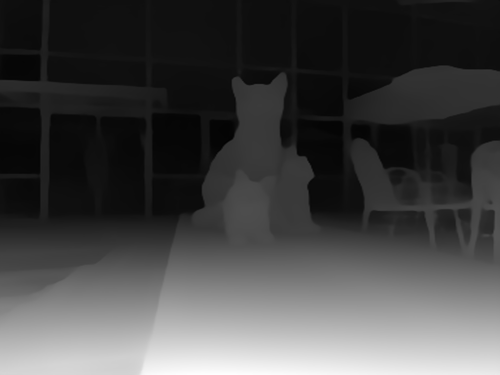
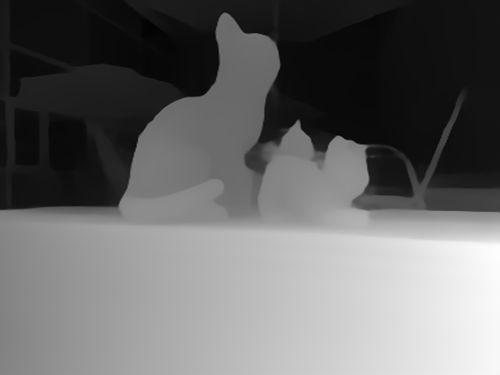
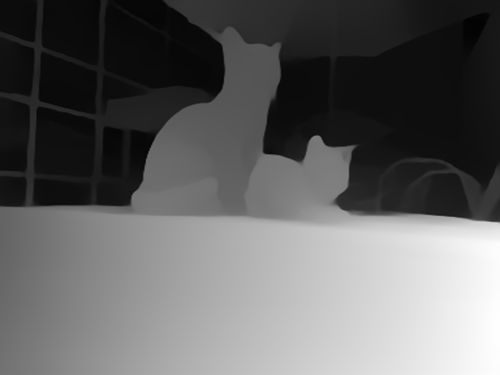

In [16]:
# Depth estimation

H_up = images[0].size[1]
W_up = images[0].size[0]
print('Size:', H_up, W_up)

depth_images = [sp2p.get_depth_map(images[i], sp2p.feature_processor, sp2p.depth_estimator) for i in range(0, len(img_indices))]
if upscale_image:
    depth_images = [img.resize((2*W, 2*H)) for img in depth_images]
else:
    depth_images = [img.resize((W, H)) for img in depth_images]

mediapy.show_images(images[:4])
mediapy.show_images(depth_images[:4])

In [17]:
# generate stylized images

def generate_views(prompt, guidance_scale=7.5, strength=0.9, num_steps=50, seed=42, length=18, show_images=False):
    N = len(images)
    stride = length
    controlnet_conditioning_scale = 1. #0.8#1. #1. #0.8
    num_images_per_prompt = 1
    print(f'num_of_views={N}, length={length}, stride={stride}, controlnet conditioning scale={controlnet_conditioning_scale}, seed={seed}')
    print('prompt:', prompt)

    print('Guidance Scale:', guidance_scale)

    images_out = []

    sp2p.pipe.scheduler = DDIMScheduler.from_pretrained(DDIM_SOURCE, subfolder="scheduler")
    #generator = torch.Generator(device="cuda").manual_seed(seed)

    #for i in range(0, 1):
    for i in range(0, (N-length)//stride+2):
        #print(l[stride*i:stride*i+length])
        generator = torch.Generator(device="cuda").manual_seed(seed)

        ii = min(stride*i+length, N)
        if ii == N:
            k = N-i*stride
        else:
            k = stride
        print(ii-stride*i)

        images_style = sp2p.controlnet_img2img_call(pipeline=sp2p.pipe,
                                                prompt=[prompt]*(ii-stride*i),
                                                image=images[stride*i:ii],
                                                control_image=depth_images[stride*i:ii],
                                                strength=strength, #0.9-1.0 usually works
                                                guidance_scale=guidance_scale,
                                                num_inference_steps=num_steps, # 50
                                                controlnet_conditioning_scale=controlnet_conditioning_scale,
                                                num_images_per_prompt=num_images_per_prompt,
                                                generator=generator,
                                                #latents=latents
                                                )
        #images_pt = sp2p.pipe.image_processor.postprocess(images_style, output_type='pt')
        images_PIL = sp2p.pipe.image_processor.postprocess(images_style, output_type='pil')
        if show_images:
            mediapy.show_images(images_PIL)
        images_out += images_PIL
    return images_out


In [20]:
# save generated views

## only fangzhou data needs png not jpg...
import os
import shutil

def save_generated_views(target_path, orig_scene_path):
    #images = [load_image(f"../instruct-nerf2nerf/data/campsite-small/images/frame_{str(i).zfill(5)}.jpg") for i in img_indices]
    H = images[0].size[1]
    W = images[0].size[0]

    if not os.path.exists(target_path):
        os.mkdir(target_path)
        os.mkdir(target_path + '/images')
        os.mkdir(target_path + '/camera_paths')

    for i, idx in enumerate(img_indices):
        if upscale_image:
            images_stylized[i].resize((int(W/2), int(H/2))).save(f"{target_path}/images/frame_{str(idx).zfill(5)}.jpg")
        else:
            images_stylized[i].resize((W, H)).save(f"{target_path}/images/frame_{str(idx).zfill(5)}.jpg")

    # Copy transforms.json and make symlinks for masks and gt images
    #shutil.copy(f'{orig_scene_path}/transforms.json', f'{target_path}')
    #os.symlink(f'../../{orig_scene_path}/images', f'{target_path}/images_second')
    #os.symlink(f'../../{orig_scene_path}/masks', f'{target_path}/masks')

    scene_name = target_path.split('/')[-1]

    print(f'Saving gif as {scene_name}.gif')
    imageio.mimsave(f'{target_path}/{scene_name}.gif', images_stylized)

scene_name: Design cat for prompt: "a cat, Design Sketch by Leonardo da Vinci"
num_of_views=20, length=18, stride=18, controlnet conditioning scale=1.0, seed=42
prompt: a cat, Design Sketch by Leonardo da Vinci
Guidance Scale: 15.0
18
Debug controlnet_conditioning_scale 1.0 True


  0%|          | 0/47 [00:00<?, ?it/s]

,,,,,,,,,,,,,,,,,

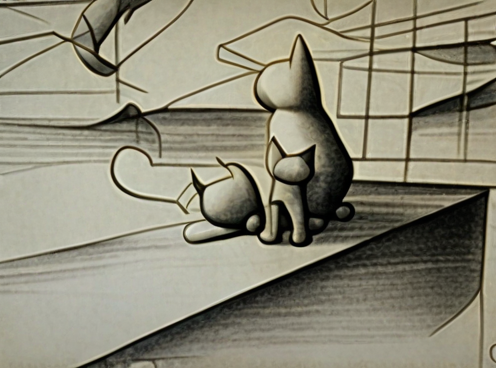
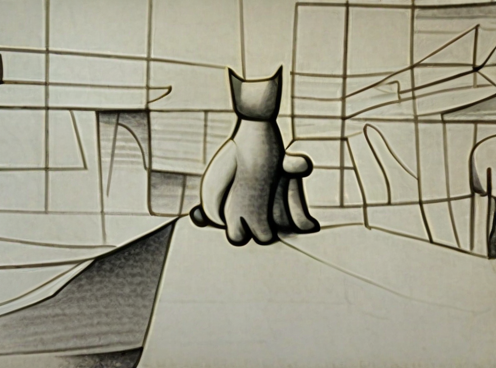
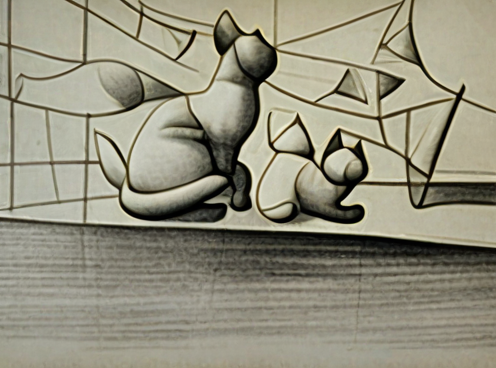
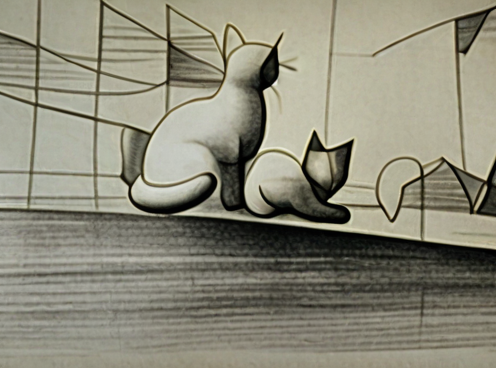
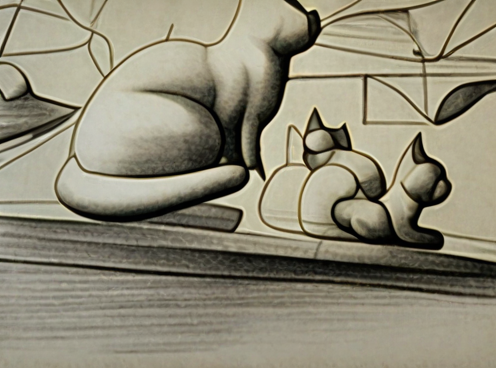
...
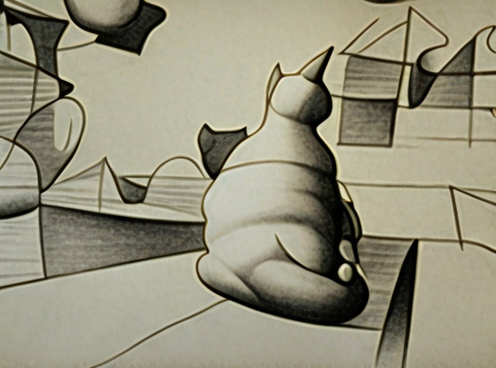
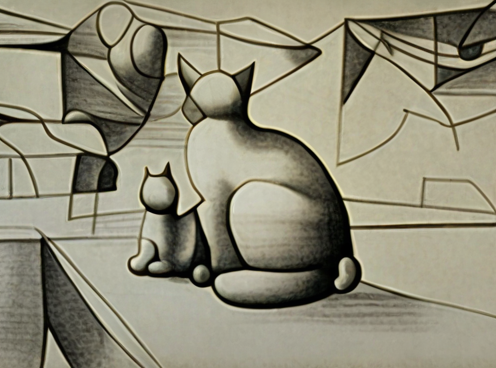
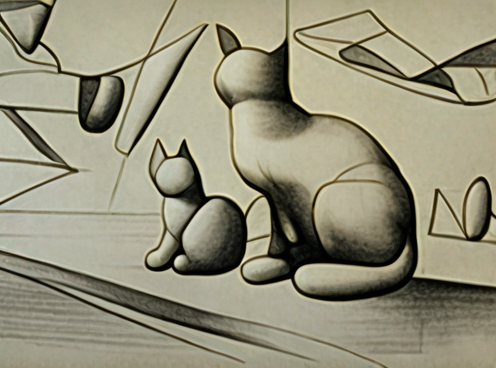
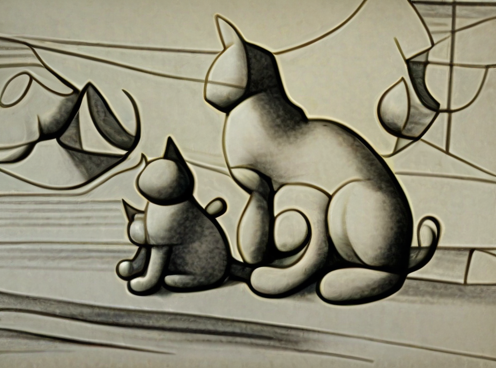
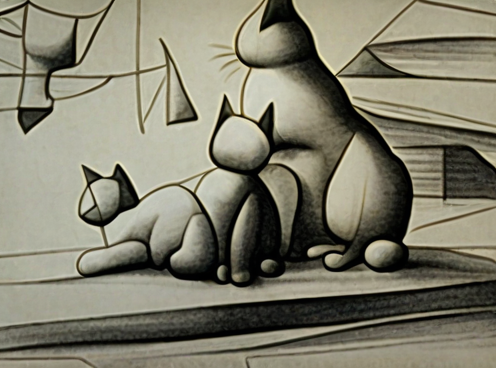

2
Debug controlnet_conditioning_scale 1.0 True


  0%|          | 0/47 [00:00<?, ?it/s]

,

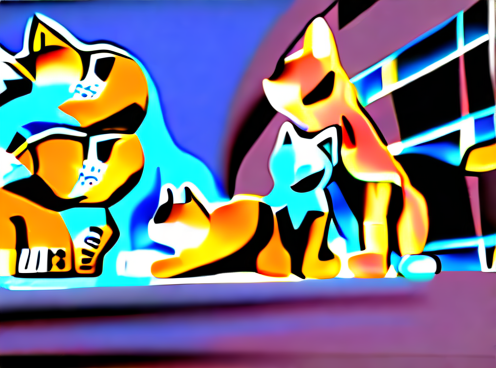
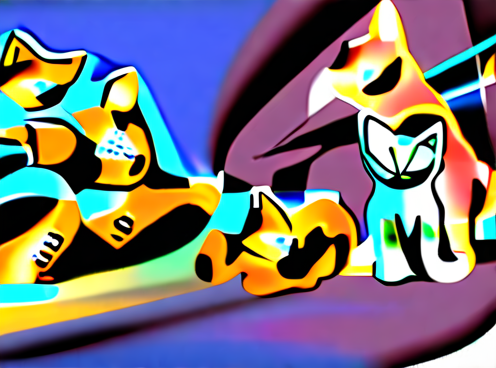

20


,,,,,

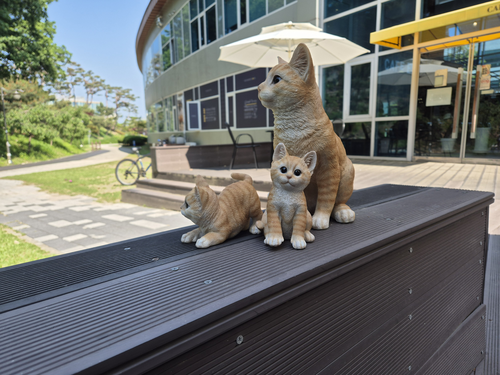
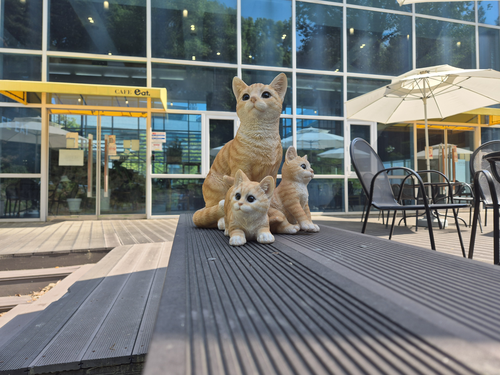
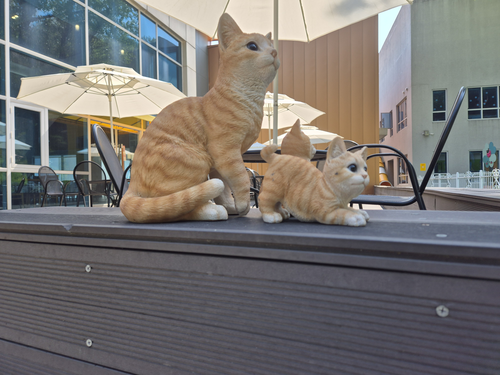
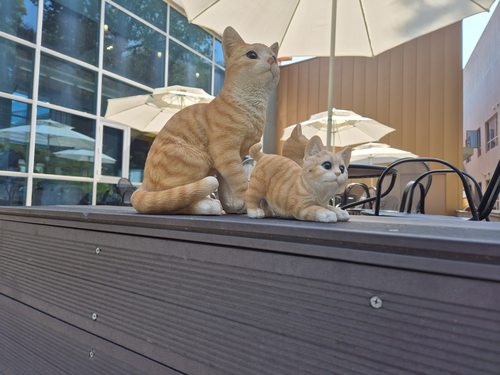
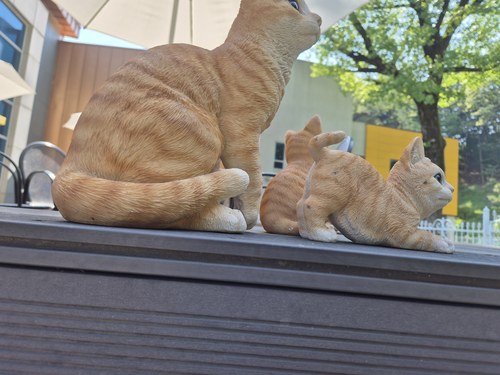
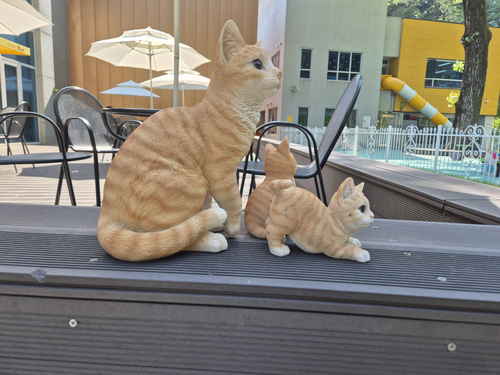

,,,,,

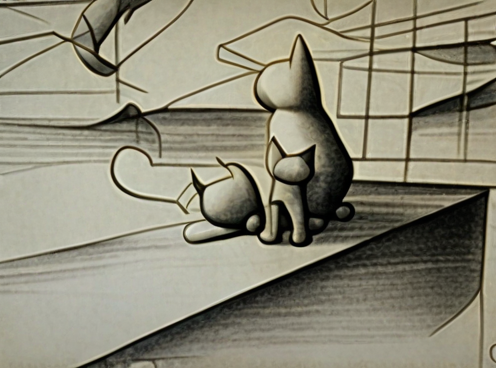
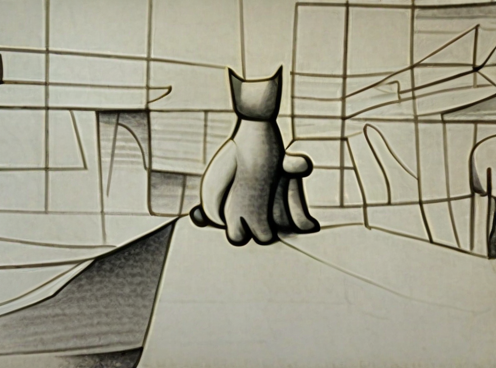
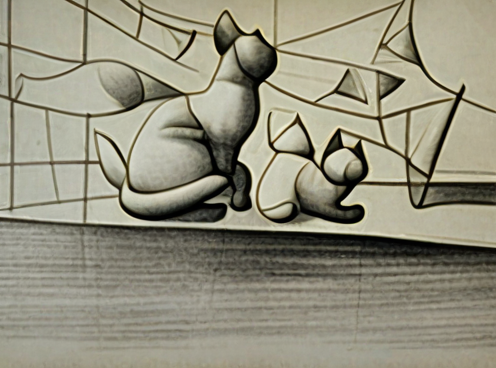
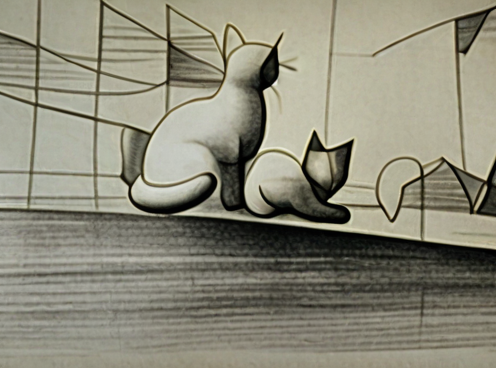
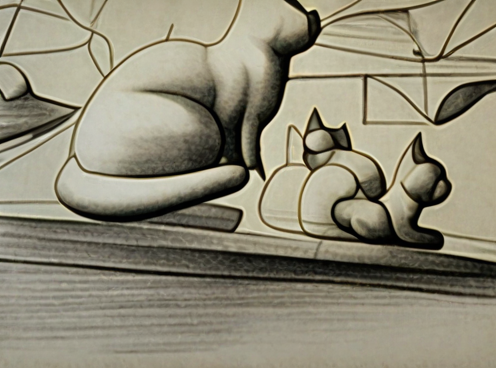
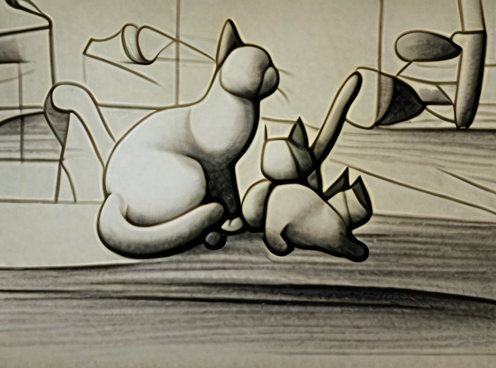

Saving gif as Design cat.gif
Stylized views saved under /content/drive/MyDrive/dataset/Design cat
ns-train sn2n --data /content/drive/MyDrive/dataset/Design cat --load-dir [path-to-trained-source-nerf] --vis viewer --save-only-latest-checkpoint True


In [21]:
# dataset generation loop

prompt = 'a cat, Design Sketch by Leonardo da Vinci'
guidance_scale = 15.
strength = 0.95
scene_name = 'Design cat'
seed = 42 #, 10, 20]
length = 18 # Adjust according to gpu memory

target_path = f'/content/drive/MyDrive/dataset/{scene_name}'
print(f'scene_name: {scene_name} for prompt: "{prompt}"')

# Generate
images_stylized = []
images_stylized = generate_views(prompt, guidance_scale=guidance_scale, strength=strength, num_steps=50, length=length, seed=seed, show_images=True)

print(len(images_stylized))
mediapy.show_images(images[:6])
mediapy.show_images(images_stylized[:6])
save_generated_views(target_path, source_path)

# Generate round end
print(f'Stylized views saved under {target_path}')

train_command = f'ns-train sn2n --data {target_path} --load-dir [path-to-trained-source-nerf] --vis viewer --save-only-latest-checkpoint True'
print(train_command)
# something like: ns-train sn2n --data data/bear-vangogh --load-dir outputs/bear/nerfacto/2024-12-05_112654/nerfstudio_models --pipeline.model.use-l1 True --pipeline.model.swd-loss-mult 1.0 --pipeline.model.orientation-loss-mult 0 --pipeline.model.pred-normal-loss-mult 0

## END

In [ ]:
mediapy.show_images(images[:2]+ images_stylized[:2])

In [ ]:
mediapy.show_images(images_PIL)

In [ ]:
mediapy.show_images(images_PIL) #